In [264]:
# !pip install pyarrow kneed tabulate wordcloud

In [32]:
# Generally useful libs
import pandas as pd
import numpy as np
import pickle
import math
import os
import re

# For visualisation
%matplotlib inline 
# Assumes Jupyter notebook
import matplotlib.pyplot as plt
from matplotlib import cm
import seaborn as sns

# For word embeddings
#from gensim.models.word2vec import Word2Vec

# For parquet files
import pyarrow

# For dimensionality reduction
import umap

# For automating the 'knee method'
from kneed import KneeLocator

# For hierarchical clustering
from scipy.cluster.hierarchy import dendrogram, linkage, fcluster, centroid
from tabulate import tabulate

# For validation and visualisation
from sklearn.metrics import confusion_matrix, classification_report, silhouette_score
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.feature_extraction.text import CountVectorizer
from ctfidf import CTFIDFVectorizer

from wordcloud import WordCloud

In [34]:
# narrow format of the letters is usually easier to read in crowded word clouds
fname = 'Arial Narrow'
tfont = {'fontname':fname, 'fontsize':12} # title font attributes
afont = {'fontname':fname, 'fontsize':10} # axis font attributes
lfont = {'fontname':fname, 'fontsize':8}  # legend font attributes

In [36]:
# Random seed
rs = 43

# Which embeddings to use
src_embeddings = 'doc_vec'

In [37]:
# Adapted from https://stackoverflow.com/a/72503304
import os
import pandas as pd

dn = 'data'
fn = 'ph-tutorial-data-cleaned.parquet'

if not os.path.exists(os.path.join(dn,fn)): 
    print(f"Couldn't find {os.path.join('data',fn)}, downloading...")
    from io import BytesIO
    from urllib.request import urlopen
    from zipfile import ZipFile

    # Where is the Zipfile stored on Zenodo?
    zipfile = 'clustering-visualizing-word-embeddings.zip'
    zipurl  = f'https://zenodo.org/records/7948908/files/{zipfile}?download=1'

    # Open the remote Zipfile and read it directly into Python
    with urlopen(zipurl) as zipresp:
        with ZipFile(BytesIO(zipresp.read())) as zf:
            for zfile in zf.namelist():
                if not zfile.startswith('__'): # Don't unpack hidden MacOSX junk
                    print(f"Extracting {zfile}") # Update the user
                    zf.extract(zfile,'.')
    print("  Downloaded.")
    # And rename the unzipped directory to 'data' --
    # IMPORTANT: Note that if 'data' already exists it will (probably) be silently overwritten.
    os.rename('clustering-visualizing-word-embeddings',dn)

print(f"Loading {fn}")
df = pd.read_parquet(os.path.join(dn,fn))

Loading ph-tutorial-data-cleaned.parquet


In [26]:
df.shape

(8002, 20)

In [27]:
df[:2]

,DDC,DDC_Num,Subject_Discipline,Title,Abstract,Author,Keywords,Institution,Department,EThOS_URL,ddc1,ddc2,ddc3,Decade,doc,tokens,length,word_vec,doc_vec,glove-wiki-gigaword-100
EThOS_ID,,,,,,,,,,,,,,,,,,,,
233009,100,100.0,"Philosophy, Psychology & Religious Studies",We have a great high priest : an examination o...,"There is a tradition of interpretation, testim...","Browne, A. S.",Religious philosophy,University of Cambridge,None,https://ethos.bl.uk/OrderDetails.do?uin=uk.bl....,Philosophy and psychology,Philosophy,Philosophy and psychology,1980s,We have a great high priest : an examination o...,"[great, high, priest, examination, relation, c...",93,"[-0.077654205, 0.251407, 0.048398178, 0.140866...","[-0.23343302, 0.289154, 0.11690994, 0.262741, ...","[0.07659128, 0.3317724, 0.13247727, 0.08003966..."
233034,900,900.0,History & Archaeology,The political transformation of peasant Russia...,This study gives an account of village politic...,"Figes, Orlando",Russian politics and society,University of Cambridge,None,https://ethos.bl.uk/OrderDetails.do?uin=uk.bl....,History and geography,History,"History, geography, and auxiliary disciplines",1980s,The political transformation of peasant Russia...,"[political_transformation, peasant, russia, pe...",84,"[0.026168758, 0.14577468, -0.0757815, 0.001476...","[0.16268738, -0.0013667074, -0.2732733, 0.0075...","[0.007818172, 0.3122564, 0.12205443, 0.2344975..."


In [38]:
dmeasure = 'euclidean' # distance metric
rdims    = 4 # r-dims == Reduced dimensionality
print(f"UMAP dimensionality reduction to {rdims} dimensions with '{dmeasure}' distance measure.")

UMAP dimensionality reduction to 4 dimensions with 'euclidean' distance measure.


In [40]:
# Extract the embedding from a list-type column
# in the source data frame using this function
def x_from_df(df:pd.DataFrame, col:str='Embedding') -> pd.DataFrame:
    cols = ['E'+str(x) for x in np.arange(0,len(df[col].iloc[0]))]
    return pd.DataFrame(df[col].tolist(), columns=cols, index=df.index)

X = x_from_df(df, col=src_embeddings)

# Create and apply a UMAP 'reducer'
reducer = umap.UMAP(
    n_neighbors=25,
    min_dist=0.01,
    n_components=rdims,
    random_state=rs)

X_embedded = reducer.fit_transform(X)

# Create a dictionary that is easily converted into a pandas df
embedded_dict = {}
for i in range(0,X_embedded.shape[1]):
    embedded_dict[f"Dim {i+1}"] = X_embedded[:,i] # D{dimension_num} (Dim 1...Dim n)

dfe = pd.DataFrame(embedded_dict, index=df.index)
del(embedded_dict)

/Users/user/opt/anaconda3/envs/py311/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [46]:
projected = df.join(dfe).sort_values(by=['ddc1','ddc2'])
print(projected.columns.tolist())

['DDC', 'DDC_Num', 'Subject_Discipline', 'Title', 'Abstract', 'Author', 'Keywords', 'Institution', 'Department', 'EThOS_URL', 'ddc1', 'ddc2', 'ddc3', 'Decade', 'doc', 'tokens', 'length', 'word_vec', 'doc_vec', 'glove-wiki-gigaword-100', 'Dim 1', 'Dim 2', 'Dim 3', 'Dim 4']


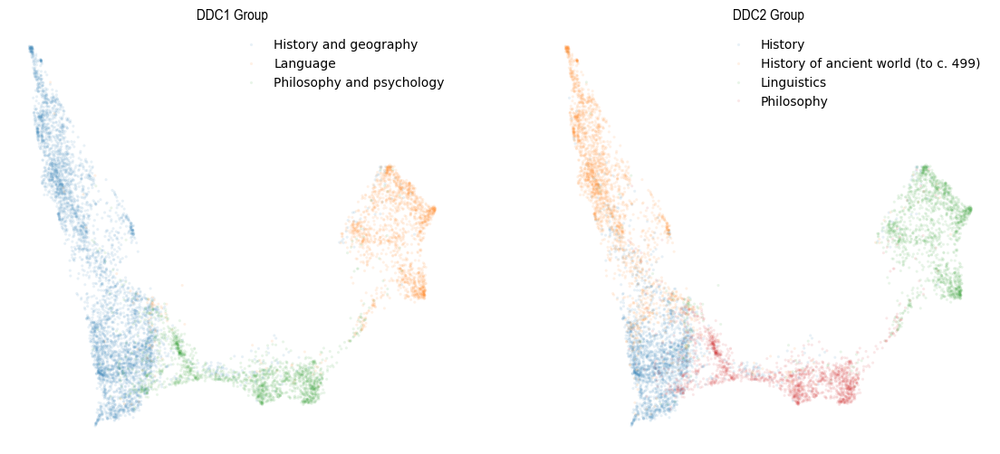

In [47]:
# Extract the embedding from a list-type column
# in the source data frame using this function

def tune_figure(ax, title:str='Title'):
    ax.axis('off')
    ax.set_title(title, **tfont)
    ax.get_legend().set_title("")
    ax.get_legend().prop.set_family(lfont['fontname'])
    ax.get_legend().prop.set_size(lfont['fontsize'])
    ax.get_legend().get_frame().set_linewidth(0.0)
    
f, axs = plt.subplots(1,2,figsize=(14,6))
axs = axs.flatten()

sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue='ddc1', s=5, alpha=0.1, ax=axs[0]);
tune_figure(axs[0], 'DDC1 Group')

sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue='ddc2', s=5, alpha=0.1, ax=axs[1]);
tune_figure(axs[1], 'DDC2 Group')

# If you want to save the output then uncomment the next line
#plt.savefig(os.path.join('data','DDC_Plot.png'), dpi=150)
plt.show()

In [48]:
# Extract the embedding from a list-type column
# in the source data frame using this function
def x_from_df(df:pd.DataFrame, col:str='Embedding') -> pd.DataFrame:
    cols = ['E'+str(x) for x in np.arange(0,len(df[col].iloc[0]))]
    return pd.DataFrame(df[col].tolist(), columns=cols, index=df.index)

X = x_from_df(df, col=src_embeddings)

# Create and apply a UMAP 'reducer'
reducer = umap.UMAP(
    n_neighbors=25,
    min_dist=0.01,
    n_components=rdims,
    random_state=rs)

X_embedded = reducer.fit_transform(X)

# Create a dictionary that is easily converted into a pandas df
embedded_dict = {}
for i in range(0,X_embedded.shape[1]):
    embedded_dict[f"Dim {i+1}"] = X_embedded[:,i] # D{dimension_num} (Dim 1...Dim n)

dfe = pd.DataFrame(embedded_dict, index=df.index)
del(embedded_dict)

/Users/user/opt/anaconda3/envs/py311/lib/python3.11/site-packages/umap/umap_.py:1943: UserWarning: n_jobs value -1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


In [49]:
projected = df.join(dfe).sort_values(by=['ddc1','ddc2'])
print(projected.columns.tolist())

['DDC', 'DDC_Num', 'Subject_Discipline', 'Title', 'Abstract', 'Author', 'Keywords', 'Institution', 'Department', 'EThOS_URL', 'ddc1', 'ddc2', 'ddc3', 'Decade', 'doc', 'tokens', 'length', 'word_vec', 'doc_vec', 'glove-wiki-gigaword-100', 'Dim 1', 'Dim 2', 'Dim 3', 'Dim 4']


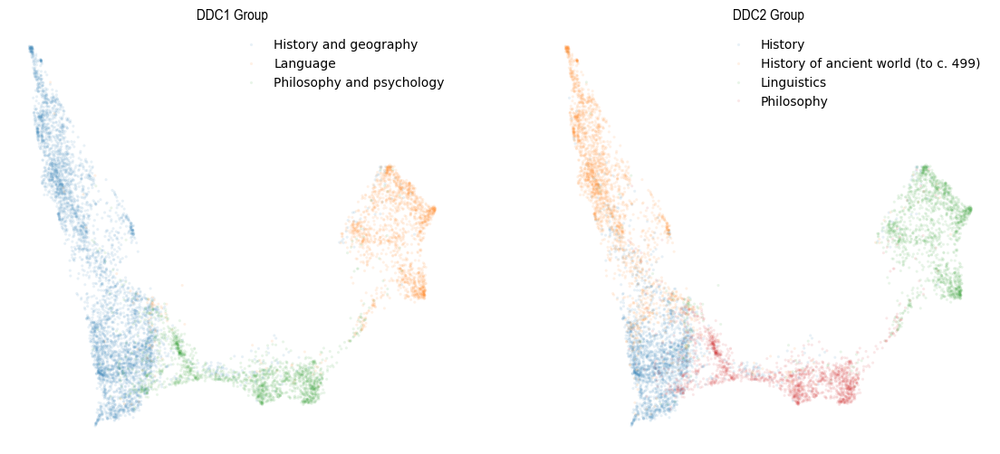

In [50]:
def tune_figure(ax, title:str='Title'):
    ax.axis('off')
    ax.set_title(title, **tfont)
    ax.get_legend().set_title("")
    ax.get_legend().prop.set_family(lfont['fontname'])
    ax.get_legend().prop.set_size(lfont['fontsize'])
    ax.get_legend().get_frame().set_linewidth(0.0)
    
f, axs = plt.subplots(1,2,figsize=(14,6))
axs = axs.flatten()

sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue='ddc1', s=5, alpha=0.1, ax=axs[0]);
tune_figure(axs[0], 'DDC1 Group')

sns.scatterplot(data=projected, x='Dim 1', y='Dim 2', hue='ddc2', s=5, alpha=0.1, ax=axs[1]);
tune_figure(axs[1], 'DDC2 Group')

# If you want to save the output then uncomment the next line
#plt.savefig(os.path.join('data','DDC_Plot.png'), dpi=150)
plt.show()

In [51]:
Z = linkage(
      projected[[x for x in projected.columns if x.startswith('Dim ')]], 
      method='ward', metric='euclidean')

# Save the output if you want to explore further later
pickle.dump(Z, open(os.path.join('data','Z.pickle'), 'wb'))

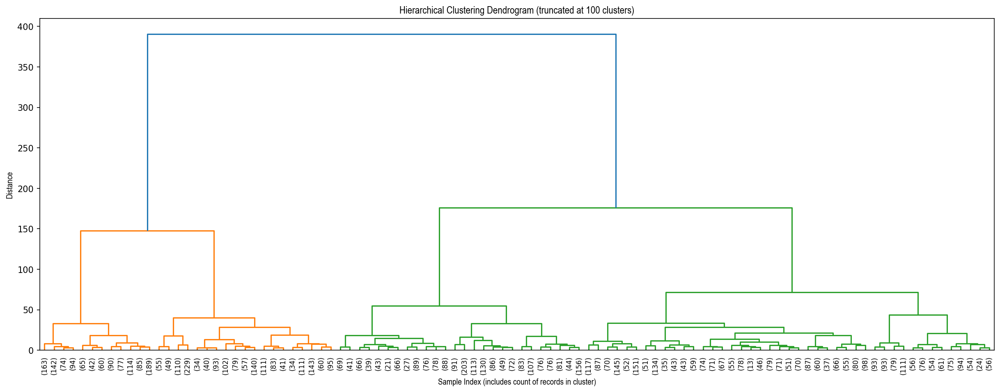

In [52]:
last_cls = 100 # The number of last clusters to show in the dendogram

plt.title(f'Hierarchical Clustering Dendrogram (truncated at {last_cls} clusters)', **tfont)
plt.xlabel('Sample Index (includes count of records in cluster)', **afont)
plt.ylabel('Distance', **afont)
fig = plt.gcf()
fig.set_size_inches(20,7)
fig.set_dpi(150)

dendrogram(
    Z,
    truncate_mode='lastp', # truncate dendrogram to the last p merged clusters
    p=last_cls,            # and set a value for last p merged clusters
    show_leaf_counts=True, # if parentheses then this is a count of observations, otherwise an id
    leaf_rotation=90.,
    leaf_font_size=8.,
    show_contracted=False, # to get a distribution impression in truncated branches
)
#plt.savefig(os.path.join('data',f'Dendogram-{c.dmeasure}-{last_cls}.png'))
plt.show()

In [53]:
table = []

# Take the 1st, the 25th, 50th and 75th 'percentiles', and the last
for i in [0, math.ceil(Z.shape[0]*0.25), math.ceil(Z.shape[0]*0.5), math.ceil(Z.shape[0]*0.75), -1]:
    r = list(Z[i])
    r.insert(0,(i if i >= 0 else len(Z)+i))
    table.append(r)
    table[-1][1] = int(table[-1][1])
    table[-1][2] = int(table[-1][2])
    table[-1][4] = int(table[-1][4])

display(
    tabulate(table, 
             headers=["Iteration","$c_{i}$","$c_{j}$","$d_{ij}$","$\sum{c_{i},c_{j}}$"], 
             floatfmt='0.3f', tablefmt='html'))

Iteration,$c_{i}$,$c_{j}$,$d_{ij}$,"$\sum{c_{i},c_{j}}$"
0,5960,6209,0.002,2
2001,5263,6168,0.061,2
4001,1984,2048,0.115,2
6001,11970,12016,0.230,8
8000,16000,16001,390.380,8002


In [54]:
# Assumes a data frame, a clustering result, and a DDC level (1, 2 or 3)
# for mapping the clusters on to 'plain English' labels from the DDC
def label_clusters(src_df:pd.DataFrame, clusterings:np.ndarray, ddc_level:int=1):
    
    num_clusters = clusterings.max()
    
    # Create a new data frame holding only the
    # cluster results but indexed to the source
    tmp = pd.DataFrame({f'Cluster_{num_clusters}':clusterings}, index=src_df.index)
    
    joined_df = src_df.join(tmp, how='inner')
    
    labels = get_dominant_cat(joined_df, clusterings.max(), ddc_level)
    
    # Map the labels for each cluster value
    joined_df[f'Cluster_Name_{num_clusters}'] = joined_df[f'Cluster_{num_clusters}'].apply(lambda x: labels[x])

    return joined_df

# Find the dominant class for each cluster assuming a specified DDC level (1, 2 or 3)
def get_dominant_cat(clustered_df:pd.DataFrame, num_clusters:int, ddc_level:int=1):
    labels = {}
    struct = {}

    # First, work out the dominant group in each cluster
    # and note that together with the cluster number --
    # this gives us a dict with key==dominant group and 
    # then one or more cluster numbers from the output above
    for cl in range(1,num_clusters+1):
    
        # Identify the dominant 'domain' (i.e. group by
        # DDC description) using the value counts result.
        dom     = clustered_df[clustered_df[f'Cluster_{num_clusters}']==cl][f'ddc{ddc_level}'].value_counts().index[0]
        print(f"Cluster {cl} dominated by {dom} theses.")
    
        if struct.get(dom) == None:
            struct[dom] = []
    
        struct[dom].append(cl)

    # Next, flip this around so that we create useful
    # cluster labels for each cluster. Since we can have
    # more than one cluster dominated by the same group
    # we have to increment them (e.g. History 1, History 2)
    for g in struct.keys():
        if len(struct[g])==1:
            labels[struct[g][0]]=g
            #print(f'{g} maps to Cluster {struct[g][0]}')
        else:
            for s in range(0,len(struct[g])):
                labels[struct[g][s]]=f'{g} {s+1}'
                #print(f'{g} {s+1} maps to Cluster {struct[g][s]}')
    return labels

In [55]:
num_clusters = 3
ddc_level = 1

In [56]:
# Extract clustering based on Z object
clusterings  = fcluster(Z, num_clusters, criterion='maxclust')
clustered_df = label_clusters(projected, clusterings, ddc_level=ddc_level)

# Classification report gives a (statistical) sense of power (TP/TN/FP/FN)
print(classification_report(
        clustered_df[f'ddc{ddc_level}'], 
        clustered_df[f'Cluster_Name_{num_clusters}'],
        zero_division=0))

# A confusion matrix is basically a cross-tab (without totals, which I think are nice)
pd.crosstab(columns=clustered_df[f'Cluster_Name_{num_clusters}'], 
            index=clustered_df[f'ddc{ddc_level}'], 
            margins=True, margins_name='Total')

Cluster 1 dominated by Language theses.
Cluster 2 dominated by History and geography theses.
Cluster 3 dominated by History and geography theses.
                           precision    recall  f1-score   support

    History and geography       0.00      0.00      0.00      4591
  History and geography 1       0.00      0.00      0.00         0
  History and geography 2       0.00      0.00      0.00         0
                 Language       0.56      0.96      0.71      1655
Philosophy and psychology       0.00      0.00      0.00      1756

                 accuracy                           0.20      8002
                macro avg       0.11      0.19      0.14      8002
             weighted avg       0.12      0.20      0.15      8002



Cluster_Name_3,History and geography 1,History and geography 2,Language,Total
ddc1,,,,
History and geography,2055,2399,137,4591
Language,7,56,1592,1655
Philosophy and psychology,8,616,1132,1756
Total,2070,3071,2861,8002


In [57]:
num_clusters = 4
ddc_level = 2

In [58]:
# Deal with long plot titles
def break_title(title:str, target_len:int=40):
  	
    words = title.split(" ")
    
    fmt_title = ''
    
    lines     = 1
    
    for i in range(len(words)):
      	# If the additional word will put us past the target length
        # for a line then add a line break at this point
        if (len(fmt_title) + len(words[i]))/target_len > lines:
            fmt_title += "\n"
            lines += 1
        
        fmt_title += words[i] + " "
    return fmt_title

Cluster 1 dominated by Philosophy theses.
Cluster 2 dominated by Linguistics theses.
Cluster 3 dominated by History of ancient world (to c. 499) theses.
Cluster 4 dominated by History theses.
Processing History DDC...
Aiming for width x height of 450 x 600
Processing History cluster (1 of 4)
Processing History of ancient world (to c. 499) cluster (2 of 4)
Processing Linguistics cluster (3 of 4)
Processing Philosophy cluster (4 of 4)
Done.
Processing History of ancient world (to c. 499) DDC...
Aiming for width x height of 450 x 600
Processing History cluster (1 of 4)
Processing History of ancient world (to c. 499) cluster (2 of 4)
Processing Linguistics cluster (3 of 4)
Processing Philosophy cluster (4 of 4)
Done.
Processing Linguistics DDC...
Aiming for width x height of 450 x 600
Processing History cluster (1 of 4)
Processing History of ancient world (to c. 499) cluster (2 of 4)
Processing Linguistics cluster (3 of 4)
Processing Philosophy cluster (4 of 4)
Done.
Processing Philosophy 

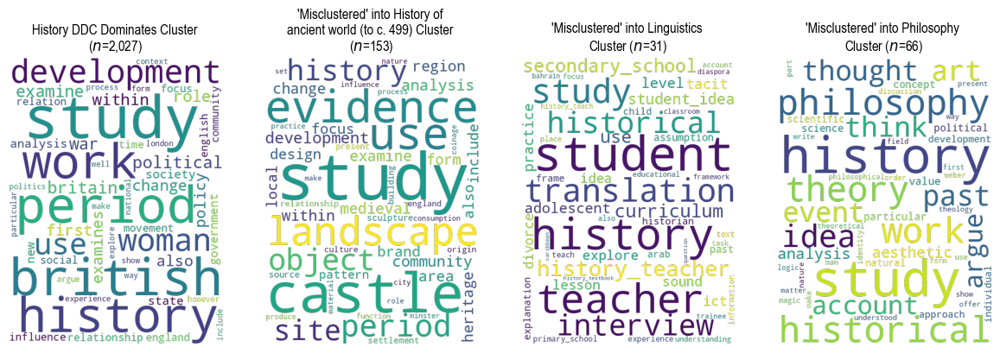

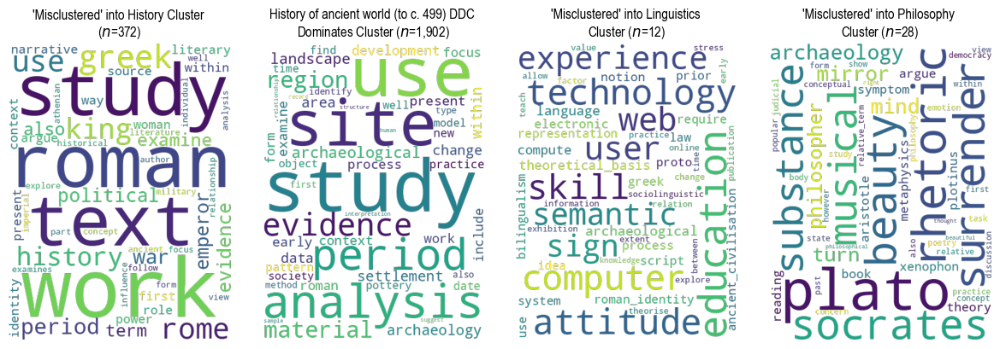

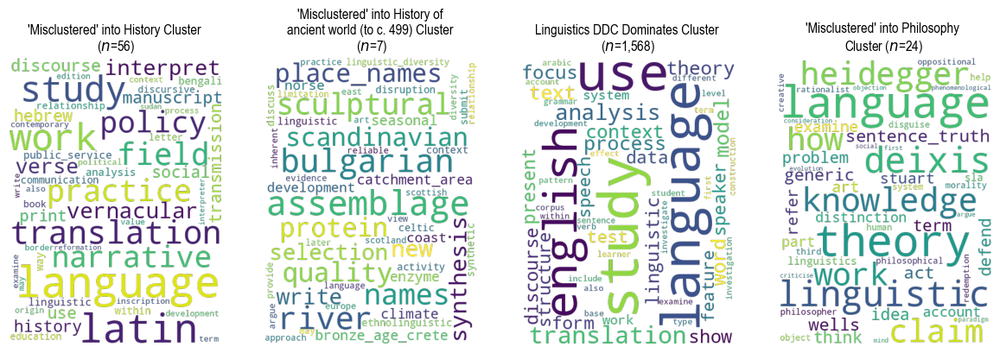

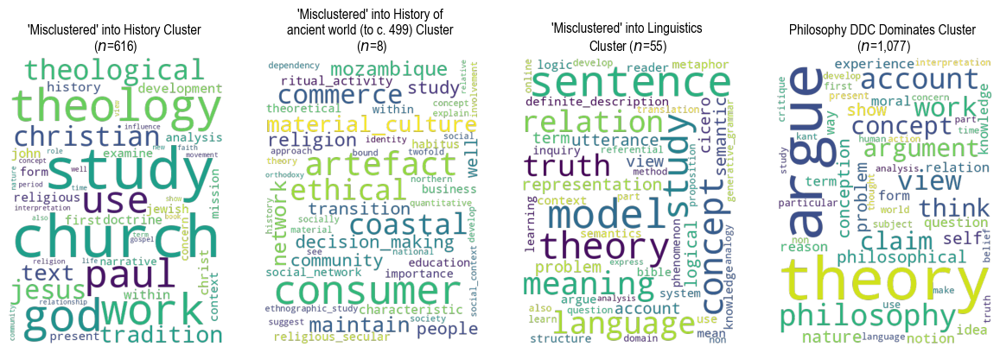

In [59]:
projected    = df.join(dfe).sort_values(by=['ddc1','ddc2'])

clusterings  = fcluster(Z, num_clusters, criterion='maxclust')
clustered_df = label_clusters(projected, clusterings, ddc_level=ddc_level)

fsize = (12,4)
dpi   = 150
nrows = 1

# For each of the named clusters... 
for ddc_name in sorted(clustered_df[f'ddc{ddc_level}'].unique()):
    
    print(f"Processing {ddc_name} DDC...")
    
    # Here's the selected data sub-frame
    sdf = clustered_df[clustered_df[f'ddc{ddc_level}']==ddc_name]
    
    # Create one document per class
    docs = pd.DataFrame({'Document': sdf.tokens.apply(' '.join), 'Class': sdf[f'Cluster_Name_{num_clusters}']})
    docs_per_class = docs.groupby(['Class'], as_index=False).agg({'Document': ' '.join})

    # Do the class-based TF/IDF analysis
    cvec  = CountVectorizer().fit(docs_per_class.Document)
    count = cvec.transform(docs_per_class.Document)
    words = cvec.get_feature_names_out()

    ctfidf = CTFIDFVectorizer().fit_transform(count, n_samples=len(docs))
    
    # Now on to the plotting
    ncols  = len(sdf[f'Cluster_Name_{num_clusters}'].unique())
    nplots = nrows * ncols
    
    axwidth  = math.floor((fsize[0]/ncols)*dpi)
    axheight = math.floor(fsize[1]/nrows*dpi)

    print(f"Aiming for width x height of {axwidth} x {axheight}")

    # One image per DDC Category
    f,axes = plt.subplots(nrows, ncols, figsize=fsize) 

    # Set up the word cloud
    Cloud = WordCloud(background_color=None, mode='RGBA', 
                      max_words=50, relative_scaling=0.5,
                      height=axheight, width=axwidth)
    
    # For each cluster...
    for i, cl in enumerate(sorted(sdf[f'Cluster_Name_{num_clusters}'].unique())):
        print(f"Processing {cl} cluster ({i+1} of {nplots})")

        try:
            ax = axes.flatten()[i]
        except AttributeError:
            ax = axes
				
        # Extract the relevant weights for each word 
        # form the ctfidf array
        tmp = pd.DataFrame({'words':words, 'weights':ctfidf.toarray()[i]}).set_index('words')
        
        # If the DDC name and cluster name match then
        # we assume it's the 'dominant' class
        if ddc_name == cl:
            ax.set_title(break_title(f"{ddc_name} DDC Dominates Cluster ($n$={(sdf[f'Cluster_Name_{num_clusters}']==cl).sum():,})"), **tfont)
        else:
            ax.set_title(break_title(f"'Misclustered' into {cl} Cluster ($n$={(sdf[f'Cluster_Name_{num_clusters}']==cl).sum():,})", 35), **tfont)
        ax.imshow(Cloud.generate_from_frequencies({x:tmp.loc[x].weights for x in tmp.index.tolist()}))
        ax.axis("off")
        del(tmp)

    while i < len(axes.flatten())-1:
        i += 1
        axes.flatten()[i].axis('off')

    plt.tight_layout()

    #plt.savefig(os.path.join(c.outputs_dir,f'{c.which_embedding}-{c.embedding}-d{c.dimensions}-ddc{ddc}-c{num_clusters}-class_tfidf-{ddc_name}.png'), dpi=dpi)
    print("Done.")

In [60]:
num_clusters = 11
ddc_level = 3

In [61]:
projected    = df.join(dfe).sort_values(by=['ddc1','ddc2'])
clusterings  = fcluster(Z, num_clusters, criterion='maxclust')
clustered_df = label_clusters(projected, clusterings, ddc_level=ddc_level)

Cluster 1 dominated by Philosophy and psychology theses.
Cluster 2 dominated by Philosophy and psychology theses.
Cluster 3 dominated by Linguistics theses.
Cluster 4 dominated by Linguistics theses.
Cluster 5 dominated by History of ancient world to c. 499 theses.
Cluster 6 dominated by History of ancient world to c. 499 theses.
Cluster 7 dominated by History of ancient world to c. 499 theses.
Cluster 8 dominated by History, geography, and auxiliary disciplines theses.
Cluster 9 dominated by History, geography, and auxiliary disciplines theses.
Cluster 10 dominated by Philosophy and psychology theses.
Cluster 11 dominated by History, geography, and auxiliary disciplines theses.


In [62]:
nplots = len(clustered_df[f'Cluster_Name_{num_clusters}'].unique())
ncols  = 3
nrows  = math.ceil(nplots/ncols)
print(f"Expecting {nplots} plots on {nrows} x {ncols} layout.")

Expecting 11 plots on 4 x 3 layout.


In [63]:
dpi      = 150
fsize    = (12,14)
axwidth  = math.floor((fsize[0]/ncols)*dpi)
axheight = math.floor(fsize[1]/nrows*dpi)

print(f"Aiming for width x height of {axwidth} x {axheight}")

Aiming for width x height of 600 x 525


In [64]:
docs = pd.DataFrame({'Document': clustered_df.tokens.apply(' '.join), 'Class': clustered_df[f'Cluster_Name_{num_clusters}']})
docs_per_class = docs.groupby(['Class'], as_index=False).agg({'Document': ' '.join})

cvec  = CountVectorizer().fit(docs_per_class.Document)
count = cvec.transform(docs_per_class.Document)
words = cvec.get_feature_names_out()

ctfidf = CTFIDFVectorizer().fit_transform(count, n_samples=len(docs))

Processing History of ancient world to c. 499 1 cluster (1 of 11)
Processing History of ancient world to c. 499 2 cluster (2 of 11)
Processing History of ancient world to c. 499 3 cluster (3 of 11)
Processing History, geography, and auxiliary disciplines 1 cluster (4 of 11)
Processing History, geography, and auxiliary disciplines 2 cluster (5 of 11)
Processing History, geography, and auxiliary disciplines 3 cluster (6 of 11)
Processing Linguistics 1 cluster (7 of 11)
Processing Linguistics 2 cluster (8 of 11)
Processing Philosophy and psychology 1 cluster (9 of 11)
Processing Philosophy and psychology 2 cluster (10 of 11)
Processing Philosophy and psychology 3 cluster (11 of 11)
Done.


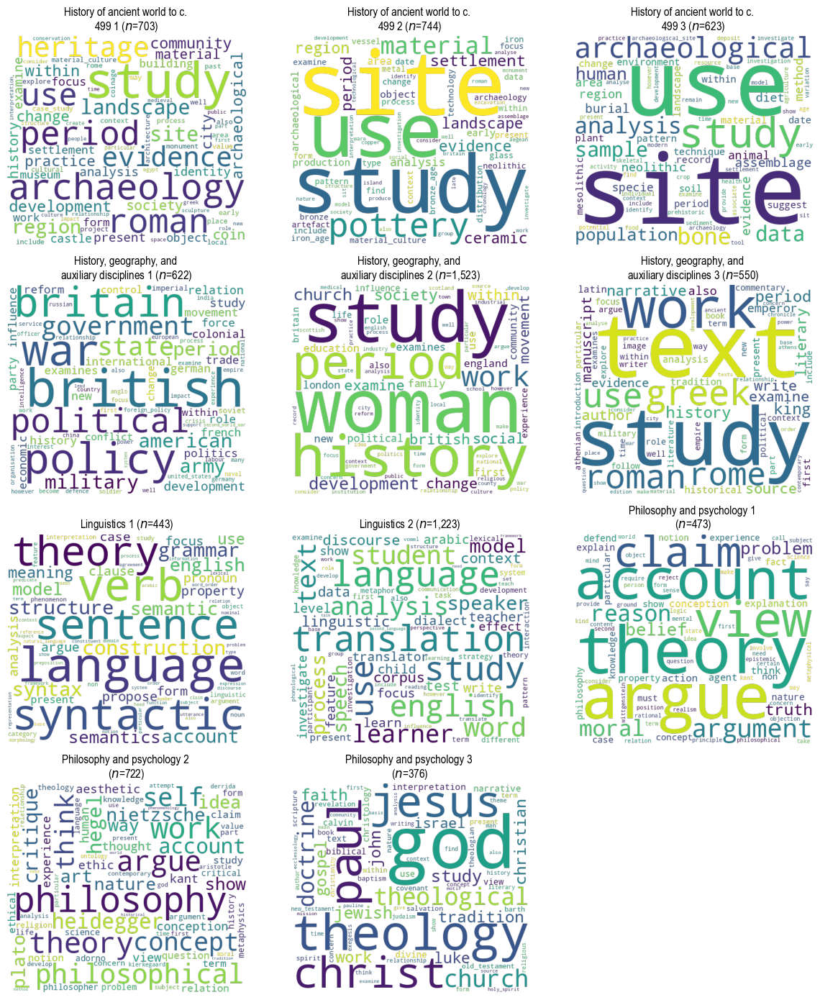

In [65]:
# Set up the figure and axes so that you have one 
# word cloud per DDC Category
f,axes = plt.subplots(nrows, ncols, figsize=fsize) 

# Set up the word cloud
Cloud = WordCloud(background_color=None, mode='RGBA', 
                  max_words=75, relative_scaling=0.5, 
                  height=axheight, width=axwidth)

# For each cluster...
for i, cl in enumerate(sorted(clustered_df[f'Cluster_Name_{num_clusters}'].unique())):
    
    print(f"Processing {cl} cluster ({i+1} of {nplots})")
    
    # This deals with the risk that there's only one
    # cluster in the analysis...
    try:
        ax = axes.flatten()[i]
    except AttributeError:
        ax = axes
       
    # Extract the column (i.e. cluster) and associate it with
    # the source words from the CountVectorizer.
    tmp = pd.DataFrame({'words':words, 'weights':ctfidf.toarray()[i]}).set_index('words')
    
    # Format the title so that it's not so long that it 
    # overlaps the titles of adjacent figures.
    ax.set_title(break_title(f"{cl} ($n$={(clustered_df[f'Cluster_Name_{num_clusters}']==cl).sum():,})", 30), **tfont)
    ax.imshow(Cloud.generate_from_frequencies({x:tmp.loc[x].weights for x in tmp.index.tolist()}))
    ax.axis("off")
    # Tidy up
    del(tmp)

# Deal with any 'leftover' or unused slots
# (e.g. you have 11 clusters on a 4*3 grid
# so 12 subplots were created)
while i < len(axes.flatten())-1:
    i += 1
    axes.flatten()[i].axis('off')

# Adjust the layout to minimise whitespace
plt.tight_layout()

#plt.savefig(os.path.join(c.outputs_dir,f'{c.which_embedding}-{c.embedding}-d{c.dimensions}-ddc{ddc}-c{num_clusters}-class_tfidf.png'), dpi=dpi)
print("Done.")

In [66]:
import pandas as pd
import umap
import umap.plot

# Used to get the data
from sklearn.datasets import fetch_20newsgroups
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer

# Some plotting libraries
import matplotlib.pyplot as plt
%matplotlib notebook
from bokeh.plotting import show, save, output_notebook, output_file
from bokeh.resources import INLINE
output_notebook(resources=INLINE)

/Users/user/opt/anaconda3/envs/py311/lib/python3.11/site-packages/dask/dataframe/__init__.py:31: FutureWarning: 
Dask dataframe query planning is disabled because dask-expr is not installed.

You can install it with `pip install dask[dataframe]` or `conda install dask`.
This will raise in a future version.

  warnings.warn(msg, FutureWarning)


Loading BokehJS ...

In [67]:
%%time
dataset = fetch_20newsgroups(subset='all',
                             shuffle=True, random_state=42)

CPU times: user 314 ms, sys: 67 ms, total: 381 ms
Wall time: 383 ms


In [68]:
print(f'{len(dataset.data)} documents')
print(f'{len(dataset.target_names)} categories')

18846 documents
20 categories


In [69]:
dataset.target_names

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

In [70]:
%%time
dataset = fetch_20newsgroups(subset='all',
                             shuffle=True, random_state=42)

CPU times: user 311 ms, sys: 45 ms, total: 356 ms
Wall time: 357 ms


In [71]:
print(f'{len(dataset.data)} documents')
print(f'{len(dataset.target_names)} categories')

18846 documents
20 categories


In [72]:
dataset.target_names

['alt.atheism',
 'comp.graphics',
 'comp.os.ms-windows.misc',
 'comp.sys.ibm.pc.hardware',
 'comp.sys.mac.hardware',
 'comp.windows.x',
 'misc.forsale',
 'rec.autos',
 'rec.motorcycles',
 'rec.sport.baseball',
 'rec.sport.hockey',
 'sci.crypt',
 'sci.electronics',
 'sci.med',
 'sci.space',
 'soc.religion.christian',
 'talk.politics.guns',
 'talk.politics.mideast',
 'talk.politics.misc',
 'talk.religion.misc']

In [73]:
for idx, document in enumerate(dataset.data[:3]):
    category = dataset.target_names[dataset.target[idx]]

    print(f'Category: {category}')
    print('---------------------------')
    # Print the first 500 characters of the post
    print(document[:500])
    print('---------------------------')

Category: rec.sport.hockey
---------------------------
From: Mamatha Devineni Ratnam <mr47+@andrew.cmu.edu>
Subject: Pens fans reactions
Organization: Post Office, Carnegie Mellon, Pittsburgh, PA
Lines: 12
NNTP-Posting-Host: po4.andrew.cmu.edu



I am sure some bashers of Pens fans are pretty confused about the lack
of any kind of posts about the recent Pens massacre of the Devils. Actually,
I am  bit puzzled too and a bit relieved. However, I am going to put an end
to non-PIttsburghers' relief with a bit of praise for the Pens. Man, they
are killin
---------------------------
Category: comp.sys.ibm.pc.hardware
---------------------------
From: mblawson@midway.ecn.uoknor.edu (Matthew B Lawson)
Subject: Which high-performance VLB video card?
Summary: Seek recommendations for VLB video card
Nntp-Posting-Host: midway.ecn.uoknor.edu
Organization: Engineering Computer Network, University of Oklahoma, Norman, OK, USA
Keywords: orchid, stealth, vlb
Lines: 21

  My brother is in the market for

In [74]:
category_labels = [dataset.target_names[x] for x in dataset.target]
hover_df = pd.DataFrame(category_labels, columns=['category'])

In [75]:
category_labels[:2]

['rec.sport.hockey', 'comp.sys.ibm.pc.hardware']

In [76]:
len(category_labels)

18846

In [77]:
type(dataset.target)

numpy.ndarray

In [78]:
dataset.data[:2]

["From: Mamatha Devineni Ratnam <mr47+@andrew.cmu.edu>\nSubject: Pens fans reactions\nOrganization: Post Office, Carnegie Mellon, Pittsburgh, PA\nLines: 12\nNNTP-Posting-Host: po4.andrew.cmu.edu\n\n\n\nI am sure some bashers of Pens fans are pretty confused about the lack\nof any kind of posts about the recent Pens massacre of the Devils. Actually,\nI am  bit puzzled too and a bit relieved. However, I am going to put an end\nto non-PIttsburghers' relief with a bit of praise for the Pens. Man, they\nare killing those Devils worse than I thought. Jagr just showed you why\nhe is much better than his regular season stats. He is also a lot\nfo fun to watch in the playoffs. Bowman should let JAgr have a lot of\nfun in the next couple of games since the Pens are going to beat the pulp out of Jersey anyway. I was very disappointed not to see the Islanders lose the final\nregular season game.          PENS RULE!!!\n\n",
 'From: mblawson@midway.ecn.uoknor.edu (Matthew B Lawson)\nSubject: Which h

In [79]:
vectorizer = CountVectorizer(min_df=5, stop_words='english')
word_doc_matrix = vectorizer.fit_transform(dataset.data)

In [80]:
word_doc_matrix

<18846x34880 sparse matrix of type '<class 'numpy.int64'>'
	with 1939023 stored elements in Compressed Sparse Row format>

In [81]:
type(dataset.data)

list

In [82]:
%%time
embedding = umap.UMAP(n_components=2, metric='hellinger').fit(word_doc_matrix)

CPU times: user 3min 40s, sys: 1.58 s, total: 3min 42s
Wall time: 36.9 s


In [83]:
embedding.embedding_.shape

(18846, 2)

In [84]:
f = umap.plot.points(embedding, labels=hover_df['category'])

<IPython.core.display.Javascript object>

In [85]:
# For interactive plotting use
f = umap.plot.interactive(embedding, labels=dataset.target, hover_data=hover_df, point_size=1)
show(f)
# f = umap.plot.points(embedding, labels=hover_df['category'])

In [86]:
## Following is a example of reaing csv file

In [87]:
# with open('test-data.csv', 'w') as f:
#     for i in range(1000):
#         f.writelines(f'{str(i%10)},"hello world"\n')
df = pd.read_csv('test-data.csv')
category_labels = df['d']
data = df['d']

In [88]:
df[:2]

,c,d
0,0,hello world
1,1,hello world


In [89]:
category_labels = df['c']
hover_df = pd.DataFrame(category_labels, columns=['c'])

In [90]:
category_labels[:2]

0    0
1    1
Name: c, dtype: int64

In [91]:
data=df['d']

In [92]:
vectorizer = CountVectorizer(min_df=5, stop_words='english')
word_doc_matrix = vectorizer.fit_transform(data)

In [93]:
word_doc_matrix

<1000x2 sparse matrix of type '<class 'numpy.int64'>'
	with 2000 stored elements in Compressed Sparse Row format>

In [94]:
%%time
embedding = umap.UMAP(n_components=2, metric='hellinger').fit(word_doc_matrix)

CPU times: user 39.6 s, sys: 439 ms, total: 40.1 s
Wall time: 9.25 s


In [95]:
embedding.embedding_.shape

(1000, 2)

In [96]:
# For interactive plotting use
f = umap.plot.interactive(embedding, labels=category_labels, hover_data=hover_df, point_size=1)
show(f)
#f = umap.plot.points(embedding, labels=hover_df['category'])

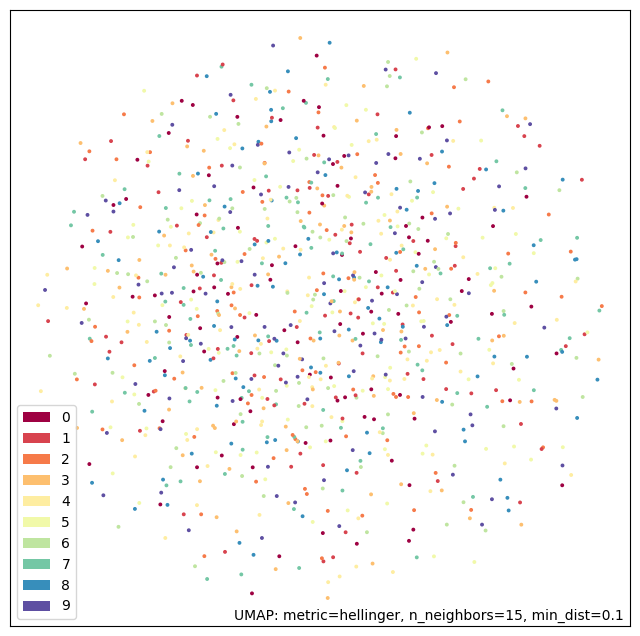

In [97]:
%matplotlib inline
f = umap.plot.points(embedding, labels=hover_df['c'])